In [121]:
%load_ext autoreload
%autoreload 2
import sys; sys.path.append('../')
from src.dataloader import load_all_series, generator
from src.visualize import plot_series, plot_all_series,show_hist, draw_changes
from src.drift_detectors import global_mean_detector, Kolmogorov_based_detector

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Concept drift
jako że dane mogą zmienić się w czasie, np uszkodzona maszyna zaczyna drgać z inną częstotliwością, albo zachowanie klientów sie zmienia po pewnym czasie, wiele modeli które są już wyuczone danej relacji pomiędzy wejściem a wyjściem może mieć z tym problem. To mniej więcej nazywamy concept driftem. Są różne metody radzenia sobie z tym:
* Cyklicznie przeuczyć na nowych  danych 
* Jeśli model można upadtować to updatować nowymi danymi
* Używać danych z wyższymi wagami (niektóre modele przyjmują dane ważone. Niech nowsze będą miały większą wagę)
* Znajdować concept drift

# Dataloading i wizualizacje

In [122]:
series = load_all_series()
plot_all_series(series)
for col in list(series.columns):
    plot_series(series,col)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [01:51<00:00, 89.44it/s]


array([[<AxesSubplot:title={'center':'x_series_0'}>,
        <AxesSubplot:title={'center':'x_series_1'}>],
       [<AxesSubplot:title={'center':'x_series_2'}>, <AxesSubplot:>]],
      dtype=object)

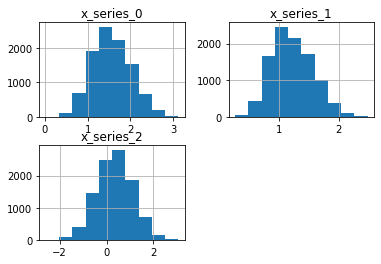

In [123]:
series.hist()

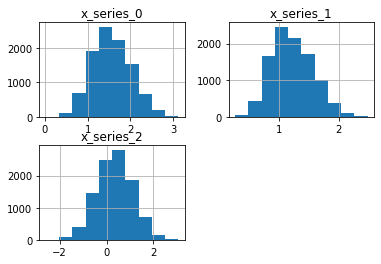

In [124]:
show_hist(series)

# Detekcja Concept driftu

In [143]:
BUFFOR_SIZE = 50
TH = 0.2

In [144]:
ids, means = global_mean_detector(1,TH,BUFFOR_SIZE)
print(len(ids))

  4%|██████████                                                                                                                                                                                                                                                                        | 365/10000 [00:00<00:02, 3623.44it/s]

series1.csv


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 9813/10000 [00:03<00:00, 3219.27it/s]

15


In [145]:
draw_changes(series,"x_series_0",ids,means)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:03<00:00, 2534.73it/s]


In [146]:
ids, means = global_mean_detector(2,TH,BUFFOR_SIZE)
draw_changes(series,"x_series_1",ids,means)

  4%|█████████▌                                                                                                                                                                                                                                                                        | 350/10000 [00:00<00:02, 3474.68it/s]

series2.csv


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:03<00:00, 3129.28it/s]


In [189]:
BUFFOR_SIZE = 150
TH = 0.15

In [190]:
ids, means = global_mean_detector(3,TH,BUFFOR_SIZE)
print(len(ids))

  3%|████████                                                                                                                                                                                                                                                                          | 292/10000 [00:00<00:03, 2898.87it/s]

series3.csv


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 9994/10000 [00:06<00:00, 1444.91it/s]

10


In [191]:
draw_changes(series,"x_series_2",ids,means)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:06<00:00, 1445.82it/s]


In [132]:
BUFFOR_SIZE = 100
TH = 0.01

In [133]:
ids, means, pvalues = Kolmogorov_based_detector(1,TH,BUFFOR_SIZE)
draw_changes(series,"x_series_0",ids,means)

  2%|██████▎                                                                                                                                                                                                                                                                           | 232/10000 [00:00<00:04, 2302.58it/s]

series1.csv


10001it [00:07, 1331.08it/s]                                                                                                                                                                                                                                                                                                 

loop end
0 9901 9901


# Źródła:
* https://neptune.ai/blog/concept-drift-best-practices
* https://machinelearningmastery.com/gentle-introduction-concept-drift-machine-learning/
* https://docs.scipy.org/doc/scipy/reference/tutorial/stats.html#kolmogorov-smirnov-test-for-two-samples-ks-2samp